In [64]:
# Suppress future warnings
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

# Import libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas
import geoviews as gv
from geoviews import opts  # Import opts explicitly
import panel as pn
from panel.template import BootstrapTemplate
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Enable panel and geoviews extensions
pn.extension()
gv.extension('bokeh')

# Create directories for outputs if they don’t exist
os.makedirs("Output", exist_ok=True)
os.makedirs("HTML", exist_ok=True)

In [2]:
# Load the CSV file into a Pandas DataFrame
ufo_data = pd.read_csv("Resources/UFO_data.csv")

In [3]:
# Display column names to verify structure
print("Columns in dataset:", ufo_data.columns)

Columns in dataset: Index(['datetime', 'city', 'state', 'country', 'shape', 'duration (seconds)',
       'duration (hours/min)', 'comments', 'date posted', 'latitude',
       'longitude'],
      dtype='object')


In [4]:
# Remove non-US sightings
ufo_data = ufo_data[ufo_data['country'] == 'us']

# Ensure 'datetime' is in datetime format
ufo_data['datetime'] = pd.to_datetime(ufo_data['datetime'], errors='coerce')

# Extract 'year' from 'datetime' and filter to include only sightings from 1947 onward
ufo_data['year'] = ufo_data['datetime'].dt.year
ufo_data = ufo_data[ufo_data['year'] >= 1947]

# Define function to save charts to 'Output' folder
def save_chart(fig, filename):
    fig.savefig(f"Output/{filename}", bbox_inches='tight')


### How have UFO sighting frequencies changed over the years, and are there noticable monthly or seasonal patterns?

In [5]:
# Ensure 'images' folder exists
if not os.path.exists('images'):
    os.makedirs('images')

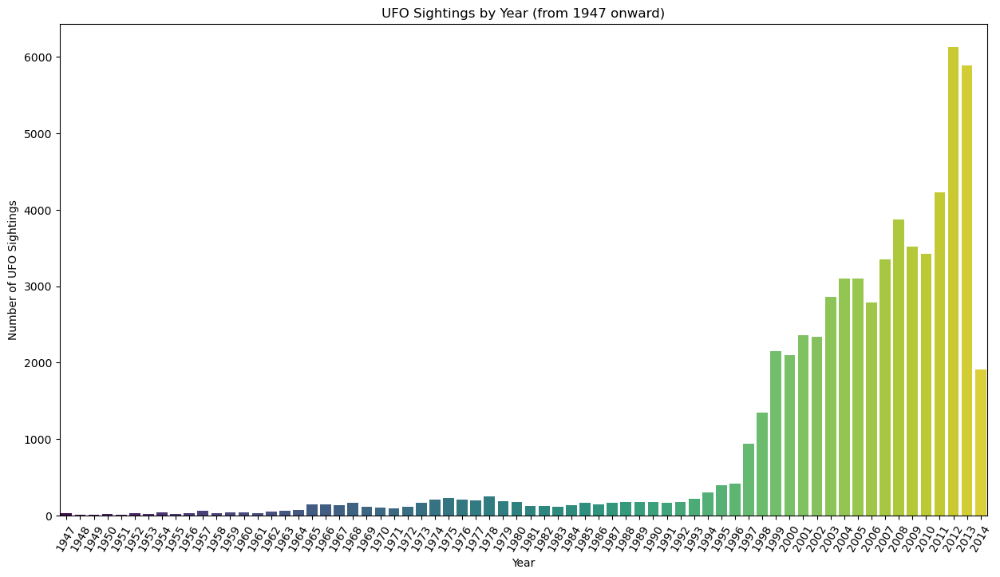

In [6]:
# 1. Bar Chart: Sightings per Year
years_data = ufo_data['year'].value_counts().sort_index()
plt.figure(figsize=(15, 8))
sns.barplot(x=years_data.index.astype(int), y=years_data.values, palette="viridis")
plt.title('UFO Sightings by Year (from 1947 onward)')
plt.xlabel('Year')
plt.ylabel('Number of UFO Sightings')
plt.xticks(rotation=60)

# Save the figure in the 'images' folder
plt.savefig('images/sightings_per_year.png', format='png')
plt.show()

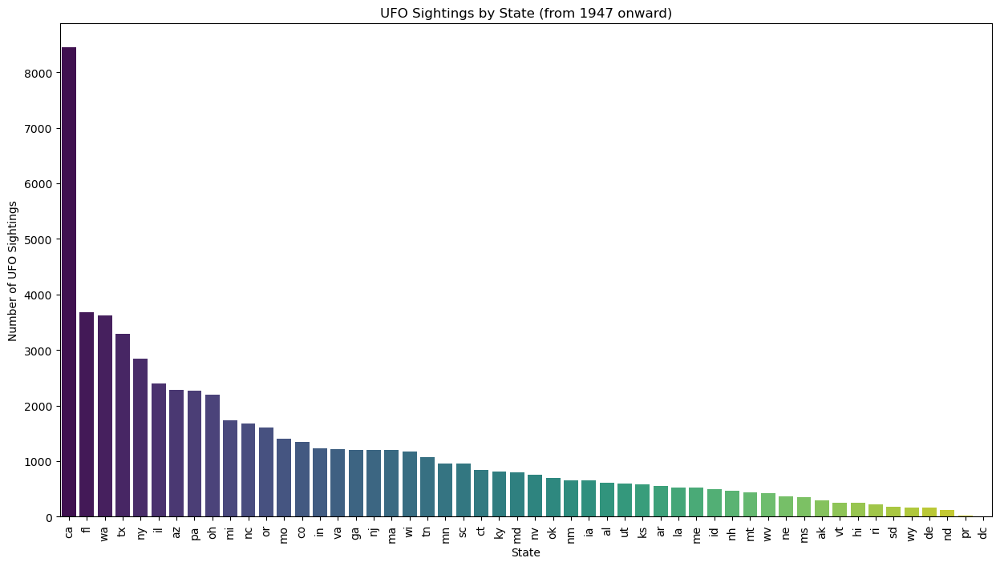

In [7]:
# 2. Bar Chart: Sightings per State
state_counts = ufo_data['state'].value_counts()
plt.figure(figsize=(15, 8))
sns.barplot(x=state_counts.index, y=state_counts.values, palette="viridis")
plt.title('UFO Sightings by State (from 1947 onward)')
plt.xlabel('State')
plt.ylabel('Number of UFO Sightings')
plt.xticks(rotation=90)
# Save the figure in the 'images' folder
plt.savefig('images/state_counts.png', format='png')
plt.show()

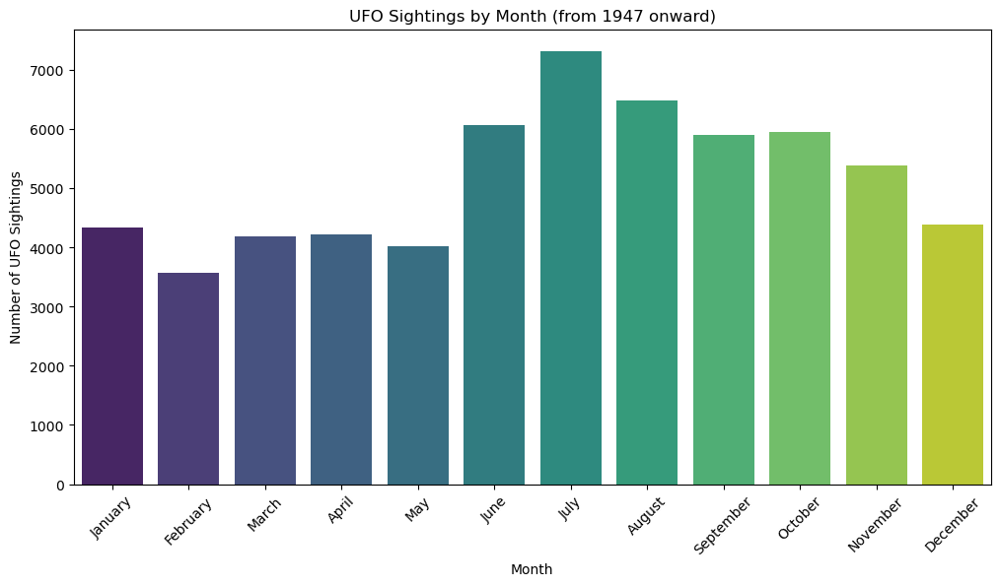

In [8]:
# 3. Bar Chart: Sightings per Month
ufo_data['month'] = ufo_data['datetime'].dt.month
month_counts = ufo_data['month'].value_counts().sort_index()
month_names = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
month_counts.index = [month_names[month - 1] for month in month_counts.index]
plt.figure(figsize=(12, 6))
sns.barplot(x=month_counts.index, y=month_counts.values, palette="viridis")
plt.title('UFO Sightings by Month (from 1947 onward)')
plt.xlabel('Month')
plt.ylabel('Number of UFO Sightings')
plt.xticks(rotation=45)
# Save the figure in the 'images' folder
plt.savefig('images/sightings_per_month.png', format='png')
plt.show()

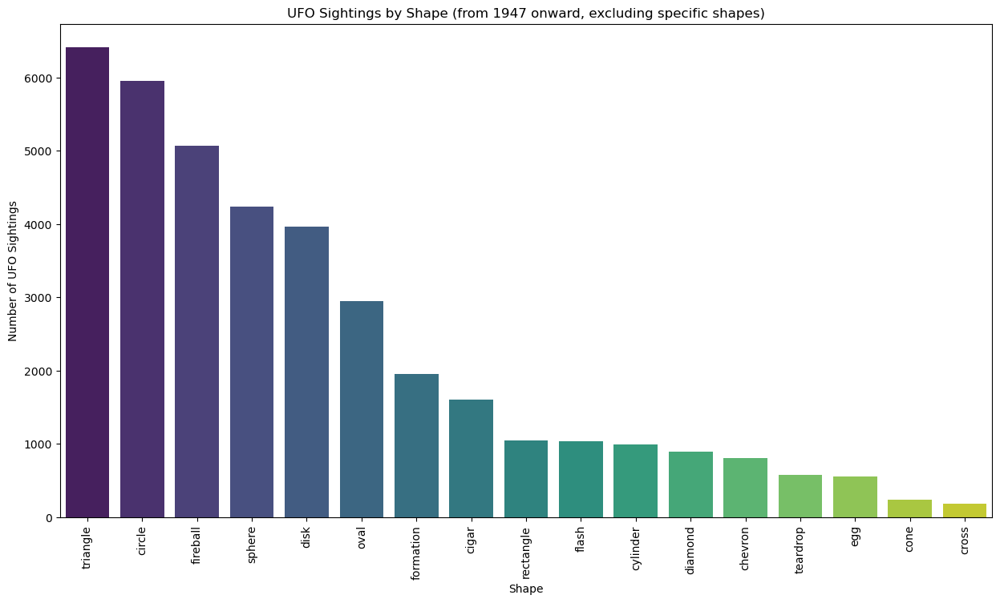

In [9]:
# 4. Bar Chart: Sightings by Shape (excluding certain shapes)
excluded_shapes = ["delta", "round", "pyramid", "flare", "hexagon", "changed", "unknown", "light", "other", "changing"]
shape_counts = ufo_data[~ufo_data['shape'].isin(excluded_shapes)]['shape'].value_counts()
plt.figure(figsize=(15, 8))
sns.barplot(x=shape_counts.index, y=shape_counts.values, palette="viridis")
plt.title('UFO Sightings by Shape (from 1947 onward, excluding specific shapes)')
plt.xlabel('Shape')
plt.ylabel('Number of UFO Sightings')
plt.xticks(rotation=90)
# Save the figure in the 'images' folder
plt.savefig('images/sightings_per_shape.png', format='png')
plt.show()

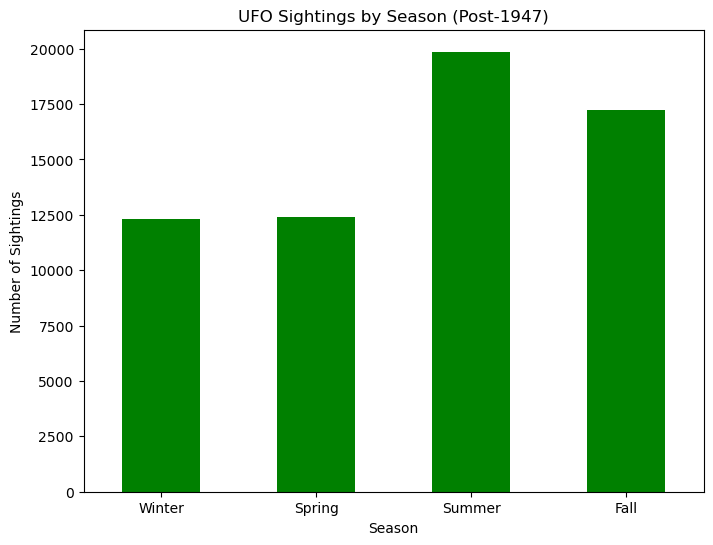

In [10]:
# Convert 'datetime' to datetime format
ufo_data['datetime'] = pd.to_datetime(ufo_data['datetime'], errors='coerce')

# Filter sightings after 1947
ufo_data_after_1947 = ufo_data[ufo_data['datetime'].dt.year > 1947].dropna(subset=['datetime'])

# Define seasons based on month
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

# Add a 'season' column
ufo_data_after_1947['season'] = ufo_data_after_1947['datetime'].dt.month.apply(get_season)

# Count sightings by season
sightings_by_season = ufo_data_after_1947['season'].value_counts().reindex(['Winter', 'Spring', 'Summer', 'Fall']).fillna(0)

# Plot the bar chart
plt.figure(figsize=(8, 6))
sightings_by_season.plot(kind='bar', color='green')
plt.title('UFO Sightings by Season (Post-1947)')
plt.xlabel('Season')
plt.ylabel('Number of Sightings')
plt.xticks(rotation=0)
# Save the figure in the 'images' folder
plt.savefig('images/sightings_by_season.png', format='png')
plt.show()

### Analysis


***1. Sightings per Year:***
   
* Trend: Sightings increased notably from the 1940s onward, peaking in the late 20th century and stabilizing with fluctuations in recent decades.
* Insight: This trend may correlate with cultural factors, increased awareness, and improved reporting methods over time.
    
***2. Sightings per State:***

* Hotspots: States like California, Texas, and Florida show the highest number of sightings, possibly due to larger populations, high levels of outdoor activity, and favorable visibility.
* Insight: These states' geographic and demographic characteristics may influence reporting frequencies.
    
***3. Sightings per Month:***

* Monthly Pattern: Sightings are more common in the summer months (June, July, August), likely due to longer daylight hours and increased outdoor activity.
* Insight: Seasonal weather patterns and outdoor activities may impact sighting visibility and reporting frequency.
    
***4. Sightings by Shape:***

* Common Shapes: Excluding ambiguous shapes, "circle," "triangle," and "disk" are the most frequently reported, aligning with classic UFO descriptions.
* Insight: Specific shapes are more memorable and likely resonate with popular UFO imagery, impacting witness recollections.
    
***5. Sightings by Season:***

* Seasonal Peaks: Sightings peak in summer, followed by fall, reflecting increased outdoor visibility and recreational activity in warmer months.
* Insight: Seasonal outdoor activities, favorable visibility, and mild weather conditions may contribute to more sightings.

**Summary**: UFO sightings have fluctuated over time, with noticeable monthly and seasonal patterns. Sightings are more frequent in summer and are concentrated in populous states. Popular UFO shapes suggest influence from cultural perceptions, and sightings have consistently reflected increased outdoor activity during warmer months.

### What are the average and most frequent durations of reported sightings, and do these vary by location?

In [11]:
# Ensure 'duration (seconds)' is numeric, handling any errors
ufo_data['duration (seconds)'] = pd.to_numeric(ufo_data['duration (seconds)'], errors='coerce')

# Calculate the average duration per state
average_duration_by_state = ufo_data.groupby('state')['duration (seconds)'].mean().reset_index()
average_duration_by_state.columns = ['state', 'average_duration']

# Calculate the most frequent duration (mode) per state
mode_duration_by_state = ufo_data.groupby('state')['duration (seconds)'].agg(
    lambda x: x.mode().iloc[0] if not x.mode().empty else None
).reset_index()
mode_duration_by_state.columns = ['state', 'most_frequent_duration']

# Merge the average and mode data
duration_stats_by_state = pd.merge(average_duration_by_state, mode_duration_by_state, on='state')

In [12]:
# Optional: Display in tabular form in the notebook
duration_stats_by_state

,state,average_duration,most_frequent_duration
0,ak,795.501706,300.0
1,al,715.065147,300.0
2,ar,677.237410,300.0
3,az,747.620604,300.0
4,ca,567.817266,300.0
5,co,515.439956,300.0
6,ct,622.445261,300.0
7,dc,235.071429,4.0
8,de,649.194444,300.0
9,fl,570.616200,300.0


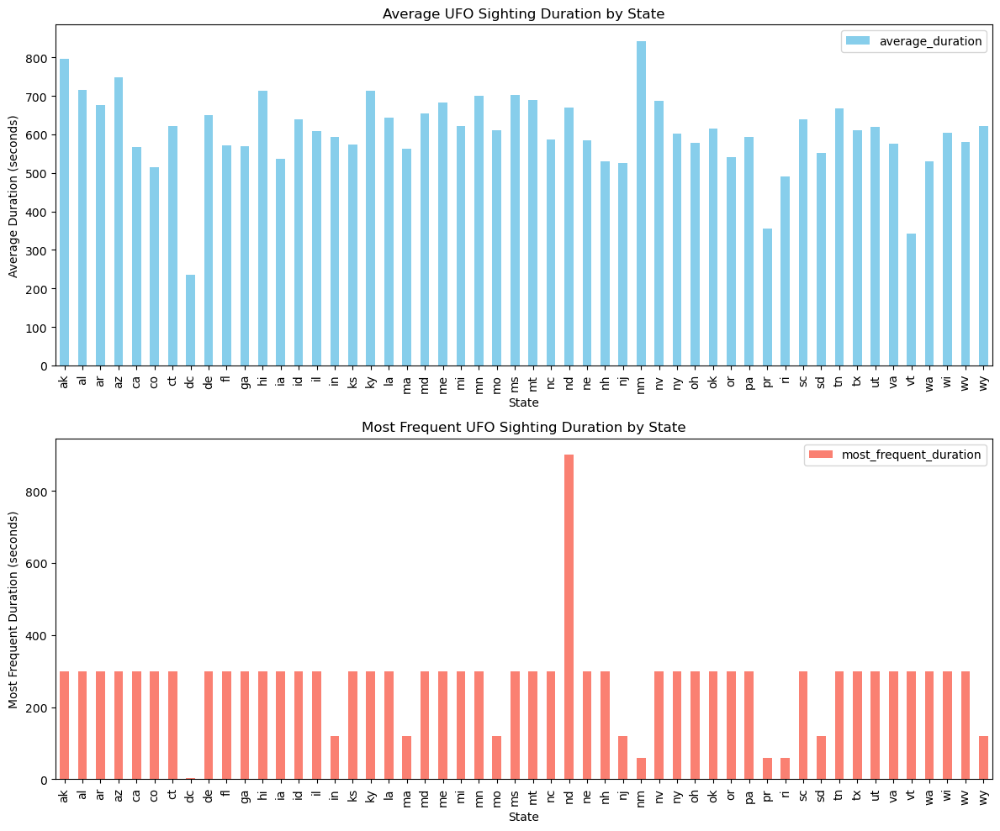

In [13]:
# Plotting average and most frequent durations by state as bar charts
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

# Average Duration Plot
duration_stats_by_state.plot(kind='bar', x='state', y='average_duration', ax=ax1, color='skyblue')
ax1.set_title('Average UFO Sighting Duration by State')
ax1.set_xlabel('State')
ax1.set_ylabel('Average Duration (seconds)')
ax1.set_xticklabels(duration_stats_by_state['state'], rotation=90)

# Most Frequent Duration Plot
duration_stats_by_state.plot(kind='bar', x='state', y='most_frequent_duration', ax=ax2, color='salmon')
ax2.set_title('Most Frequent UFO Sighting Duration by State')
ax2.set_xlabel('State')
ax2.set_ylabel('Most Frequent Duration (seconds)')
ax2.set_xticklabels(duration_stats_by_state['state'], rotation=90)

plt.tight_layout()
# Save the figure in the 'images' folder
plt.savefig('images/duration_stats_by_state.png', format='png')
plt.show()

### Anaylsis


* Average Duration: Sightings generally last 10-13 minutes across states, with higher averages in open, less populated areas like Alaska and Arizona. This suggests these areas offer fewer obstructions, allowing for longer observations.
* Most Frequent Duration: A common sighting duration is 5 minutes, possibly due to rounded estimates or quick observations. States with brief sightings might reflect conditions where visibility is limited.
* Patterns by Location: High-density states like California and Florida report frequent but brief sightings, potentially due to distractions or light pollution. Rural states with longer durations may benefit from clear skies and fewer interruptions.
* Overall: UFO sightings tend to be short but are consistent in duration nationwide. Rural settings and environmental factors appear to influence sighting duration, possibly making certain areas more conducive to longer observations.


### HeatMaps for UFO Sightings

In [14]:
# Ensure directory for HTML output exists
os.makedirs("HTML", exist_ok=True)

In [65]:
# Convert 'datetime' and 'date posted' to datetime objects if needed
if 'datetime' in ufo_data.columns:
    ufo_data['datetime'] = pd.to_datetime(ufo_data['datetime'], errors='coerce')
if 'date posted' in ufo_data.columns:
    ufo_data['date posted'] = pd.to_datetime(ufo_data['date posted'], errors='coerce')

# Filter data to include only sightings from 1947 onward
ufo_data = ufo_data[ufo_data['datetime'].dt.year >= 1947]

# Exclude specific shapes
excluded_shapes = ["delta", "round", "pyramid", "flare", "hexagon", "changed", "unknown", "light", "other", "changing"]
ufo_data = ufo_data[~ufo_data['shape'].isin(excluded_shapes)]

# Prepare the map plot using hvplot
ufo_map = ufo_data.hvplot.points(
    'longitude', 'latitude', geo=True, color='shape', size=7, 
    hover_cols=['date posted', 'latitude', 'longitude', 'duration (seconds)'],
    tiles='OSM', frame_width=800, frame_height=600
).opts(
    opts.Points(
        tools=['hover', 'tap'],  # Enables hover and tap (click) interactions
        size=7,
        color='shape',  # Color based on UFO shape
        width=800,
        height=600,
        title="UFO Sightings Heat Map (from 1947 onward, excluding specific shapes)",
        show_legend=True
    )
)

# Save the heat map to HTML for website use
pn.pane.HoloViews(ufo_map).save("HTML/ufo_map.html")

# Display the map with interactive features
ufo_map

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (shape,date posted,duration (seconds))

In [66]:
# Convert 'datetime' and 'date posted' to datetime objects if needed
if 'datetime' in ufo_data.columns:
    ufo_data['datetime'] = pd.to_datetime(ufo_data['datetime'], errors='coerce')
if 'date posted' in ufo_data.columns:
    ufo_data['date posted'] = pd.to_datetime(ufo_data['date posted'], errors='coerce')

# Filter data to include only sightings from 1947 onward
ufo_data = ufo_data[ufo_data['datetime'].dt.year >= 1947]

# Exclude specific shapes
excluded_shapes = ["delta", "round", "pyramid", "flare", "hexagon", "changed", "unknown", "light", "other", "changing"]
ufo_data = ufo_data[~ufo_data['shape'].isin(excluded_shapes)]

# Define color and marker mappings for each shape
color_mapping = {
    "circle": "blue",
    "triangle": "green",
    "disk": "purple",
    "sphere": "orange",
    "fireball": "red",
    "cylinder": "cyan",
    "chevron": "magenta",
}

marker_mapping = {
    "circle": "circle",
    "triangle": "triangle",
    "disk": "diamond",
    "sphere": "square",
    "fireball": "star",
    "cylinder": "hex",
    "chevron": "inverted_triangle",
}

# Create a dropdown widget for shape selection
shape_options = list(ufo_data['shape'].unique())
shape_select = pn.widgets.Select(name='Select Shape', options=shape_options, value=shape_options[0])

# Function to create the map based on selected shape
def create_shape_map(selected_shape):
    # Filter the data for the selected shape
    shape_data = ufo_data[ufo_data['shape'] == selected_shape]
    
    # Customize hover columns
    hover_cols = ['city', 'state', 'datetime', 'comments', 'longitude', 'latitude']
    
    # Create the map with only the selected shape, applying specific color and marker
    shape_map = shape_data.hvplot.points(
        'longitude', 'latitude', geo=True,
        color=color_mapping.get(selected_shape, 'gray'),
        marker=marker_mapping.get(selected_shape, 'circle'),  # Use specific marker for each shape
        size=10,  # Increase point size for better visibility
        hover_cols=hover_cols,  # Only show selected columns in hover
        tiles='OSM', frame_width=800, frame_height=600
    ).opts(
        opts.Points(
            tools=['hover', 'tap'],  # Enables hover and tap (click) interactions
            width=800,
            height=600,
            title=f"UFO Sightings for Shape: {selected_shape} (from 1947 onward)",
            show_legend=True
        )
    )
    
    return shape_map

# Save the initial shape map to HTML
initial_shape_map = create_shape_map(shape_options[0])
pn.pane.HoloViews(initial_shape_map).save("HTML/shape_map.html")

# Bind the map creation function to the shape selection widget
interactive_map = pn.bind(create_shape_map, selected_shape=shape_select)

# Layout the widget and map together
pn.Column(shape_select, interactive_map).servable()

Column
    [0] Select(options=['cylinder', 'circle', ...], value='cylinder')
    [1] ParamFunction(function, _pane=HoloViews, defer_load=False)

In [17]:
# Configure the simplified map plot
ufo_map_simple = ufo_data.hvplot.points(
    "longitude",
    "latitude",
    geo=True,
    tiles="EsriNatGeo",
    frame_width=700,
    frame_height=500,
    color="shape",
    size=7
)

# Save `ufo_map_simple` directly without using widgets
pn.pane.HoloViews(ufo_map_simple).save("HTML/ufo_map_simple.html")

# Display the map plot
ufo_map_simple

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (shape)

In [18]:
## Define a mapping of shape names to marker symbols and colors
shape_marker_map = {
    "circle": ("circle", "blue"),
    "square": ("square", "green"),
    "triangle": ("triangle", "red"),
    "disk": ("circle_cross", "purple"),
    "cylinder": ("hex", "orange"),
    "sphere": ("dot", "pink"),
    "diamond": ("diamond", "yellow")
    # Add more shapes and corresponding markers and colors as needed
}

# Prepare overlays for each shape, assigning specific marker symbols and colors
overlays = []
for shape, (marker, color) in shape_marker_map.items():
    shape_data = ufo_data[ufo_data["shape"] == shape]  # Filter data for each shape
    plot = shape_data.hvplot.points(
        "longitude", "latitude",
        geo=True,
        tiles="EsriNatGeo",
        frame_width=800,
        frame_height=600,
        size=15,                # Increased point size for better visibility
        color=color,            # Use specific color for each shape
        marker=marker,
        label=shape             # Label for legend
    ).opts(legend_position='right')  # Place the legend on the right
    overlays.append(plot)

# Combine overlays into a single map without restricting bounds
ufo_map_with_shapes = gv.Overlay(overlays).opts(
    title="Global UFO Sightings Map by Shape",
    show_legend=True
)

# Save `ufo_map_with_shapes` directly as an HTML
pn.pane.HoloViews(ufo_map_with_shapes).save("HTML/ufo_map_with_shapes.html")

# Display the map
ufo_map_with_shapes


:Overlay
   .WMTS.I          :WMTS   [Longitude,Latitude]
   .Points.Circle   :Points   [longitude,latitude]
   .WMTS.II         :WMTS   [Longitude,Latitude]
   .Points.Square   :Points   [longitude,latitude]
   .WMTS.III        :WMTS   [Longitude,Latitude]
   .Points.Triangle :Points   [longitude,latitude]
   .WMTS.IV         :WMTS   [Longitude,Latitude]
   .Points.Disk     :Points   [longitude,latitude]
   .WMTS.V          :WMTS   [Longitude,Latitude]
   .Points.Cylinder :Points   [longitude,latitude]
   .WMTS.VI         :WMTS   [Longitude,Latitude]
   .Points.Sphere   :Points   [longitude,latitude]
   .WMTS.VII        :WMTS   [Longitude,Latitude]
   .Points.Diamond  :Points   [longitude,latitude]

In [19]:
# Convert 'datetime' to datetime objects if needed and extract the year
ufo_data['datetime'] = pd.to_datetime(ufo_data['datetime'], errors='coerce')
ufo_data['year'] = ufo_data['datetime'].dt.year  # Extract year

# Drop rows with NaN values in the 'year' column
ufo_data = ufo_data.dropna(subset=['year'])

# Convert the 'year' column to integers
ufo_data['year'] = ufo_data['year'].astype(int)

# Define a mapping of shape names to marker symbols and colors
shape_marker_map = {
    "circle": ("circle", "blue"),
    "square": ("square", "green"),
    "triangle": ("triangle", "red"),
    "disk": ("circle_cross", "purple"),
    "cylinder": ("hex", "orange"),
    "sphere": ("dot", "pink"),
    "light": ("star", "cyan"),
    "diamond": ("diamond", "yellow")
}

# Create a slider widget for year selection
year_slider = pn.widgets.IntSlider(name='Year', start=ufo_data['year'].min(), end=ufo_data['year'].max(), step=1, value=ufo_data['year'].min())

# Function to update the map based on the selected year
def plot_ufo_sightings_by_year(year):
    # Filter data for the selected year
    year_data = ufo_data[ufo_data['year'] == year]
    
    # Prepare overlays for each shape with specific marker symbols and colors
    overlays = []
    for shape, (marker, color) in shape_marker_map.items():
        shape_data = year_data[year_data["shape"] == shape]  # Filter data for each shape
        if not shape_data.empty:  # Only plot if there's data for this shape in the selected year
            plot = shape_data.hvplot.points(
                "longitude", "latitude",
                geo=True,
                tiles="EsriNatGeo",
                frame_width=800,
                frame_height=600,
                size=15,
                color=color,
                marker=marker,
                label=shape
            ).opts(legend_position='right')
            overlays.append(plot)
    
    # Combine overlays into a single map
    return gv.Overlay(overlays).opts(title=f"UFO Sightings Map by Shape for {year}", show_legend=True)

# Generating initial year map to save
initial_year = year_slider.value
ufo_map_by_year = plot_ufo_sightings_by_year(initial_year)


# Wrap the year slider and interactive map in a layout and save with embedding enabled
year_slider_panel = pn.Column(year_slider, pn.bind(plot_ufo_sightings_by_year, year=year_slider))
year_slider_panel.save("HTML/ufo_map_with_year_slider_standalone.html", embed=True)

# Bind the function to the year slider
ufo_map_by_year = pn.bind(plot_ufo_sightings_by_year, year=year_slider)

# Display the slider and the map
pn.Column(year_slider, ufo_map_by_year).servable()

Column
    [0] IntSlider(end=2014, name='Year', start=1947, value=1947)
    [1] ParamFunction(function, _pane=HoloViews, defer_load=False)

In [20]:
# Convert 'datetime' to datetime objects and extract the year
ufo_data['datetime'] = pd.to_datetime(ufo_data['datetime'], errors='coerce')
ufo_data['year'] = ufo_data['datetime'].dt.year

# Drop rows with NaN values in 'year', 'longitude', or 'latitude' columns
ufo_data = ufo_data.dropna(subset=['year', 'longitude', 'latitude'])

# Convert the 'year' column to integers to prevent slider issues
ufo_data['year'] = ufo_data['year'].astype(int)

# Define a mapping of shape names to marker symbols and colors
shape_marker_map = {
    "circle": ("circle", "blue"),
    "square": ("square", "green"),
    "triangle": ("triangle", "red"),
    "disk": ("circle_cross", "purple"),
    "cylinder": ("hex", "orange"),
    "sphere": ("dot", "pink"),
    "light": ("star", "cyan"),
    "diamond": ("diamond", "yellow")
}

# Create a Player widget for year playback
year_player = pn.widgets.Player(
    name='Year', start=ufo_data['year'].min(), end=ufo_data['year'].max(),
    step=1, value=ufo_data['year'].min(), width=800, loop_policy='loop'
)

# Function to update the map based on the selected year
def plot_ufo_sightings_by_year(year):
    # Filter data for the selected year
    year_data = ufo_data[ufo_data['year'] == year]
    
    # Add a base tile layer to ensure the map always displays
    base_map = gv.tile_sources.EsriNatGeo.opts(width=800, height=600)
    
    # Return just the base map if there's no data for the selected year
    if year_data.empty:
        return base_map.opts(title=f"No sightings for {year}")

    # Prepare overlays for each shape with specific marker symbols and colors
    overlays = [base_map]  # Start with the base map
    for shape, (marker, color) in shape_marker_map.items():
        shape_data = year_data[year_data["shape"] == shape]  # Filter data for each shape
        if not shape_data.empty:  # Only plot if there's data for this shape in the selected year
            plot = shape_data.hvplot.points(
                "longitude", "latitude",
                geo=True,
                size=15,
                color=color,
                marker=marker,
                label=shape
            ).opts(legend_position='right')
            overlays.append(plot)
    
    # Combine overlays into a single map
    return gv.Overlay(overlays).opts(title=f"UFO Sightings Map by Shape for {year}", show_legend=True)

# Saving with the Player widget
initial_year = year_player.value
ufo_map_with_loops = plot_ufo_sightings_by_year(initial_year)


# Wrap the year player and interactive map in a layout and save with embedding enabled
year_player_panel = pn.Column(year_player, pn.bind(plot_ufo_sightings_by_year, year=year_player))
year_player_panel.save("HTML/ufo_map_with_year_player_standalone.html", embed=True)

# Bind the function to the year player
ufo_map_by_year = pn.bind(plot_ufo_sightings_by_year, year=year_player)

# Display the player and the map
pn.Column(year_player, ufo_map_by_year).servable()

Column
    [0] Player(end=2014, loop_policy='loop', name='Year', start=1947, value=1947, value_throttled=1947, width=800)
    [1] ParamFunction(function, _pane=HoloViews, defer_load=False)

# Unsupervised Machine Learning


In [23]:
# Read the CSV file into a Pandas DataFrame
df_UFOs = pd.read_csv("Resources/UFO_data.csv")

# Keep only US
df_UFOs = df_UFOs[df_UFOs['country'] == 'us']

# Review the DataFrame
df_UFOs.head()

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111
1,10/10/1956 21:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833
2,10/10/1960 20:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611
3,10/10/1961 19:00,bristol,tn,us,sphere,300.0,5 minutes,My father is now 89 my brother 52 the girl wit...,4/27/2007,36.595000,-82.188889
4,10/10/1965 23:45,norwalk,ct,us,disk,1200.0,20 minutes,A bright orange color changing to reddish colo...,10/2/1999,41.117500,-73.408333


In [24]:
df_UFOs.shape

(62327, 11)

In [25]:
# Convert 'datetime' to datetime format
df_UFOs['datetime'] = pd.to_datetime(df_UFOs['datetime'], errors='coerce')

# Drop rows with NaT values (invalid dates)
df_UFOs = df_UFOs.dropna(subset=['datetime'])

# Extract the year and month from the 'datetime' column
df_UFOs['year seen'] = df_UFOs['datetime'].dt.year
df_UFOs['month seen'] = df_UFOs['datetime'].dt.month

# Check the DataFrame to see the new column
df_UFOs.head()

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year seen,month seen
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949,10
1,1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956,10
2,1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960,10
3,1961-10-10 19:00:00,bristol,tn,us,sphere,300.0,5 minutes,My father is now 89 my brother 52 the girl wit...,4/27/2007,36.595000,-82.188889,1961,10
4,1965-10-10 23:45:00,norwalk,ct,us,disk,1200.0,20 minutes,A bright orange color changing to reddish colo...,10/2/1999,41.117500,-73.408333,1965,10


In [26]:
# Unique shapes
unique_shapes = df_UFOs['shape'].unique()
unique_shapes

array(['cylinder', 'circle', 'light', 'sphere', 'disk', 'fireball',
       'unknown', 'oval', 'other', 'rectangle', 'chevron', 'formation',
       'triangle', 'cigar', 'changing', 'diamond', 'flash', 'egg',
       'teardrop', 'cone', 'cross', 'pyramid', 'round', 'delta', 'flare',
       'hexagon', 'changed'], dtype=object)

In [27]:
# Code shapes as ints
df_UFOs['shape_int'] = pd.Categorical(df_UFOs['shape']).codes
df_UFOs.head()

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year seen,month seen,shape_int
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949,10,7
1,1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956,10,4
2,1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960,10,17
3,1961-10-10 19:00:00,bristol,tn,us,sphere,300.0,5 minutes,My father is now 89 my brother 52 the girl wit...,4/27/2007,36.595000,-82.188889,1961,10,23
4,1965-10-10 23:45:00,norwalk,ct,us,disk,1200.0,20 minutes,A bright orange color changing to reddish colo...,10/2/1999,41.117500,-73.408333,1965,10,10


In [28]:
# Unique shapes
unique_states = df_UFOs['state'].unique()
unique_states

array(['tx', 'hi', 'tn', 'ct', 'al', 'fl', 'ca', 'nc', 'ny', 'ky', 'mi',
       'ma', 'ks', 'sc', 'wa', 'co', 'nh', 'wi', 'me', 'ga', 'pa', 'il',
       'ar', 'mo', 'oh', 'az', 'mn', 'nv', 'ne', 'or', 'ia', 'va', 'in',
       'id', 'nm', 'nj', 'wv', 'ok', 'ri', 'vt', 'la', 'pr', 'ak', 'ms',
       'ut', 'md', 'mt', 'wy', 'sd', 'de', 'nd', 'dc'], dtype=object)

In [29]:
# Define the mapping dictionary
# Northwest: AK, ID, MT, OR, WA, WY
# Southwest: AZ, CA, CO, HI, NM, NV, UT
# Central Plains: KS, ND, NE, OK, SD, TX
# Midwest: IA, IL, IN, KY, MI, MN, MO, OH, WI
# South: AL, AR, FL, GA, LA, MS, PR, SC, TN
# Mid-Atlantic: DC, DE, MD, NC, NJ, PA, VA, WV
# Northeast: CT, MA, ME, NH, NY, RI, VT
state_mapping = {
    'ak': 0, 'id': 0, 'mt': 0, 'or': 0, 'wa': 0, 'wy': 0,
    'az': 1, 'ca': 1, 'co': 1, 'hi': 1, 'nm': 1, 'nv': 1, 'ut': 1,
    'ks': 2, 'nd': 2, 'ne': 2, 'ok': 2, 'sd': 2, 'tx': 2,
    'ia': 3, 'il': 3, 'in': 3, 'ky': 3, 'mi': 3, 'mn': 3, 'mo': 3, 'oh': 3, 'wi': 3,
    'al': 4, 'ar': 4, 'fl': 4, 'ga': 4, 'la': 4, 'ms': 4, 'pr': 4, 'sc': 4, 'tn': 4,
    'dc': 5, 'de': 5, 'md': 5, 'nc': 5, 'nj': 5, 'pa': 5, 'va': 5, 'wv': 5,
    'ct': 6, 'ma': 6, 'me': 6, 'nh': 6, 'ny': 6, 'ri': 6, 'vt': 6
}

# Map the 'state' column using the dictionary
df_UFOs['state_region'] = df_UFOs['state'].map(state_mapping)
df_UFOs.head()

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year seen,month seen,shape_int,state_region
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949,10,7,2
1,1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956,10,4,2
2,1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960,10,17,1
3,1961-10-10 19:00:00,bristol,tn,us,sphere,300.0,5 minutes,My father is now 89 my brother 52 the girl wit...,4/27/2007,36.595000,-82.188889,1961,10,23,4
4,1965-10-10 23:45:00,norwalk,ct,us,disk,1200.0,20 minutes,A bright orange color changing to reddish colo...,10/2/1999,41.117500,-73.408333,1965,10,10,6


In [30]:
# Define the political dictionary
# Red: 'ak', 'id', 'nv', 'ut', 'wy', 'mt', 'nd', 'sd', 'ne', 'ks', 
#      'ok', 'tx', 'ia', 'mo', 'ar', 'la', 'wi', 'mi', 'in', 'oh', 
#      'pa', 'wv', 'ky', 'tn', 'nc', 'sc', 'ga', 'fl', 'al', 'ms', 'az'
# Blue: 'hi', 'wa', 'or', 'ca', 'co', 'nm', 'mn', 'il', 'va', 'md' 
#       'de', 'nj', 'dc', 'ny', 'ct', 'ri', 'ma', 'vt', 'nh', 'me', 'pr'
political_mapping = {
    'hi': 0, 'wa': 0, 'or': 0, 'ca': 0, 'co': 0, 'nm': 0, 'mn': 0, 'il': 0, 'va': 0, 'md': 0, 
    'de': 0, 'nj': 0, 'dc': 0, 'ny': 0, 'ct': 0, 'ri': 0, 'ma': 0, 'vt': 0, 'nh': 0, 'me': 0, 'pr': 0,
    'ak': 1, 'id': 1, 'nv': 1, 'ut': 1, 'wy': 1, 'mt': 1, 'nd': 1, 'sd': 1, 'ne': 1, 'ks': 1, 
    'ok': 1, 'tx': 1, 'ia': 1, 'mo': 1, 'ar': 1, 'la': 1, 'wi': 1, 'mi': 1, 'in': 1, 'oh': 1, 
    'pa': 1, 'wv': 1, 'ky': 1, 'tn': 1, 'nc': 1, 'sc': 1, 'ga': 1, 'fl': 1, 'al': 1, 'ms': 1, 'az': 1
}

# Map the 'state' column using the dictionary
df_UFOs['political_affiliation'] = df_UFOs['state'].map(political_mapping)
df_UFOs.head()

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year seen,month seen,shape_int,state_region,political_affiliation
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,2700.0,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949,10,7,2,1
1,1956-10-10 21:00:00,edna,tx,us,circle,20.0,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956,10,4,2,1
2,1960-10-10 20:00:00,kaneohe,hi,us,light,900.0,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960,10,17,1,0
3,1961-10-10 19:00:00,bristol,tn,us,sphere,300.0,5 minutes,My father is now 89 my brother 52 the girl wit...,4/27/2007,36.595000,-82.188889,1961,10,23,4,1
4,1965-10-10 23:45:00,norwalk,ct,us,disk,1200.0,20 minutes,A bright orange color changing to reddish colo...,10/2/1999,41.117500,-73.408333,1965,10,10,6,0


In [31]:
df_UFOs.dtypes

datetime                 datetime64[ns]
city                             object
state                            object
country                          object
shape                            object
duration (seconds)              float64
duration (hours/min)             object
comments                         object
date posted                      object
latitude                        float64
longitude                       float64
year seen                         int32
month seen                        int32
shape_int                          int8
state_region                      int64
political_affiliation             int64
dtype: object

In [32]:
df_UFOs.columns

Index(['datetime', 'city', 'state', 'country', 'shape', 'duration (seconds)',
       'duration (hours/min)', 'comments', 'date posted', 'latitude',
       'longitude', 'year seen', 'month seen', 'shape_int', 'state_region',
       'political_affiliation'],
      dtype='object')

In [33]:
df_UFOs.drop(columns=['datetime', 'city', 'state', 'country', 'shape', 'duration (hours/min)', 'comments', 'date posted'], inplace=True)
df_UFOs.head()

,duration (seconds),latitude,longitude,year seen,month seen,shape_int,state_region,political_affiliation
0,2700.0,29.883056,-97.941111,1949,10,7,2,1
1,20.0,28.978333,-96.645833,1956,10,4,2,1
2,900.0,21.418056,-157.803611,1960,10,17,1,0
3,300.0,36.595000,-82.188889,1961,10,23,4,1
4,1200.0,41.117500,-73.408333,1965,10,10,6,0


In [34]:
# Create a a list to store inertia values and the values of k
inertia = []
k = list(range(1, 11))

In [35]:
# Create a for-loop where each value of k is evaluated using the K-means algorithm
# Fit the model using the service_ratings DataFrame
# Append the value of the computed inertia from the `inertia_` attribute of the KMeans model instance
for i in k:
    k_model = KMeans(n_clusters=i, random_state=1)
    k_model.fit(df_UFOs)
    inertia.append(k_model.inertia_)

In [36]:
# Define a DataFrame to hold the values for k and the corresponding inertia
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)

# Review the DataFrame
df_elbow.head()

,k,inertia
0,1,8.333058e+10
1,2,2.406554e+10
2,3,1.112502e+10
3,4,4.426280e+09
4,5,2.980706e+09


In [37]:
# Plot the DataFrame
df_elbow.hvplot.line(
    x="k", 
    y="inertia", 
    title="Elbow Curve", 
    xticks=k
)

:Curve   [k]   (inertia)

In [38]:
# Define the model with 4 clusters
model = KMeans(n_clusters=4, random_state=1)

# Fit the model
model.fit(df_UFOs)

# Make predictions
k_4 = model.predict(df_UFOs)

# Create a copy of the DataFrame
UFOs_predictions_df = df_UFOs.copy()

# Add a class column with the labels
UFOs_predictions_df['sighting_segment'] = k_4

In [39]:
# Plot the clusters
plot = UFOs_predictions_df.hvplot.scatter(
    x="latitude",
    y="longitude",
    by="sighting_segment",
    title="UFO Sightings by Latitude and Longitude"
)

# Save as html in the 'images' folder
hvplot.save(plot, "images/UFO_lat_long_scatterplot.html")

plot

:NdOverlay   [sighting_segment]
   :Scatter   [latitude]   (longitude)

In [40]:
# Plot the clusters
plot_regions = UFOs_predictions_df.hvplot.scatter(
    x="state_region",
    y="duration (seconds)",
    by="sighting_segment",
    title="UFO Sightings by Region and Duration"
)

# Save as html in the 'images' folder
hvplot.save(plot_regions, "images/UFO_region_duration_scatterplot.html")

plot_regions

:NdOverlay   [sighting_segment]
   :Scatter   [state_region]   (duration (seconds))

In [41]:
# Plot the clusters
plot_shapes_regions = UFOs_predictions_df.hvplot.scatter(
    x="state_region",
    y="shape_int",
    by="sighting_segment",
    title="UFO Sightings by Region and Shape"
)

# Save as html in the 'images' folder
hvplot.save(plot_shapes_regions, "images/UFO_region_shapes_scatterplot.html")

plot_shapes_regions

:NdOverlay   [sighting_segment]
   :Scatter   [state_region]   (shape_int)

In [42]:
# Plot the clusters
plot_shapes = UFOs_predictions_df.hvplot.scatter(
    x="shape_int",
    y="duration (seconds)",
    by="sighting_segment",
    title="UFO Sightings by Shape and Duration"
)

# Save as html in the 'images' folder
hvplot.save(plot_shapes, "images/UFO_shapes_duration_scatterplot.html")

plot_shapes

:NdOverlay   [sighting_segment]
   :Scatter   [shape_int]   (duration (seconds))

In [43]:
UFOs_predictions_df

,duration (seconds),latitude,longitude,year seen,month seen,shape_int,state_region,political_affiliation,sighting_segment
0,2700.0,29.883056,-97.941111,1949,10,7,2,1,3
1,20.0,28.978333,-96.645833,1956,10,4,2,1,0
2,900.0,21.418056,-157.803611,1960,10,17,1,0,2
3,300.0,36.595000,-82.188889,1961,10,23,4,1,0
4,1200.0,41.117500,-73.408333,1965,10,10,6,0,2
...,...,...,...,...,...,...,...,...,...
65224,600.0,36.165833,-86.784444,2013,9,17,4,1,0
65225,1200.0,43.613611,-116.202500,2013,9,4,0,1,2
65226,1200.0,38.297222,-122.284444,2013,9,18,1,0,2
65227,5.0,38.901111,-77.265556,2013,9,4,5,0,0


In [44]:
# Define summer or not dictionary
# Summer Month: 6, 7, 8
# Not Summer Month: 1, 2, 3, 4, 5, 9, 10, 11, 12
season_mapping = {
    1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 9: 0, 10: 0, 11: 0, 12: 0,
    6: 1, 7: 1, 8: 1
}

# Map the 'season' column using the dictionary
df_UFOs['season'] = df_UFOs['month seen'].map(season_mapping)
df_UFOs_season = df_UFOs.drop(['month seen'], axis=1)
df_UFOs_season.head()

,duration (seconds),latitude,longitude,year seen,shape_int,state_region,political_affiliation,season
0,2700.0,29.883056,-97.941111,1949,7,2,1,0
1,20.0,28.978333,-96.645833,1956,4,2,1,0
2,900.0,21.418056,-157.803611,1960,17,1,0,0
3,300.0,36.595000,-82.188889,1961,23,4,1,0
4,1200.0,41.117500,-73.408333,1965,10,6,0,0


In [45]:
# Seperate the features, X,  from the target variable, y
y = df_UFOs_season['season']
X = df_UFOs_season.drop(['season'], axis=1)

In [46]:
# Review the features data
X.head()

,duration (seconds),latitude,longitude,year seen,shape_int,state_region,political_affiliation
0,2700.0,29.883056,-97.941111,1949,7,2,1
1,20.0,28.978333,-96.645833,1956,4,2,1
2,900.0,21.418056,-157.803611,1960,17,1,0
3,300.0,36.595000,-82.188889,1961,23,4,1
4,1200.0,41.117500,-73.408333,1965,10,6,0


In [47]:
# Preview the first five entries for the target variable
y[:5]

0    0
1    0
2    0
3    0
4    0
Name: season, dtype: int64

In [48]:
# Split the dataset using train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

In [49]:
# Instantiate a StandardScaler instance
scaler = StandardScaler()

# Fit the training data to the standard scaler
X_scaler = scaler.fit(X_train)

# Transform the training data using the scaler
X_train_scaled = X_scaler.transform(X_train)

# Transform the testing data using the scaler
X_test_scaled = X_scaler.transform(X_test)

In [50]:
# Import the KNeighborsClassifier module from sklearn
from sklearn.neighbors import KNeighborsClassifier

# Instantiate the KNeighborsClassifier model with n_neighbors = 10
knn = KNeighborsClassifier(n_neighbors=10)

In [51]:
# Train the model using the training data
knn.fit(X_train_scaled, y_train)

KNeighborsClassifier(n_neighbors=10)

In [52]:
# Create predictions using the testing data
y_pred = knn.predict(X_test_scaled)

In [53]:
# Print the classification report comparing the testing data to the model predictions
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.91      0.80     10613
           1       0.46      0.16      0.24      4860

    accuracy                           0.68     15473
   macro avg       0.58      0.54      0.52     15473
weighted avg       0.63      0.68      0.62     15473



In [54]:
# Create a copy for political affiliation analysis
df_UFOs_politics = df_UFOs.copy()
df_UFOs_politics

,duration (seconds),latitude,longitude,year seen,month seen,shape_int,state_region,political_affiliation,season
0,2700.0,29.883056,-97.941111,1949,10,7,2,1,0
1,20.0,28.978333,-96.645833,1956,10,4,2,1,0
2,900.0,21.418056,-157.803611,1960,10,17,1,0,0
3,300.0,36.595000,-82.188889,1961,10,23,4,1,0
4,1200.0,41.117500,-73.408333,1965,10,10,6,0,0
...,...,...,...,...,...,...,...,...,...
65224,600.0,36.165833,-86.784444,2013,9,17,4,1,0
65225,1200.0,43.613611,-116.202500,2013,9,4,0,1,0
65226,1200.0,38.297222,-122.284444,2013,9,18,1,0,0
65227,5.0,38.901111,-77.265556,2013,9,4,5,0,0


In [55]:
# Seperate the features, X,  from the target variable, y
y = df_UFOs_politics['political_affiliation']
X = df_UFOs_politics.drop(['political_affiliation'], axis=1)

In [56]:
# Review the features data
X.head()

,duration (seconds),latitude,longitude,year seen,month seen,shape_int,state_region,season
0,2700.0,29.883056,-97.941111,1949,10,7,2,0
1,20.0,28.978333,-96.645833,1956,10,4,2,0
2,900.0,21.418056,-157.803611,1960,10,17,1,0
3,300.0,36.595000,-82.188889,1961,10,23,4,0
4,1200.0,41.117500,-73.408333,1965,10,10,6,0


In [57]:
# Preview the first five entries for the target variable
y[:5]

0    1
1    1
2    0
3    1
4    0
Name: political_affiliation, dtype: int64

In [58]:
# Split the dataset using train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

In [59]:
# Instantiate a StandardScaler instance
scaler = StandardScaler()

# Fit the training data to the standard scaler
X_scaler = scaler.fit(X_train)

# Transform the training data using the scaler
X_train_scaled = X_scaler.transform(X_train)

# Transform the testing data using the scaler
X_test_scaled = X_scaler.transform(X_test)

In [60]:
# Import the KNeighborsClassifier module from sklearn
from sklearn.neighbors import KNeighborsClassifier

# Instantiate the KNeighborsClassifier model with n_neighbors = 3
knn = KNeighborsClassifier(n_neighbors=3)

In [61]:
# Train the model using the training data
knn.fit(X_train_scaled, y_train)

KNeighborsClassifier(n_neighbors=3)

In [62]:
# Create predictions using the testing data
y_pred = knn.predict(X_test_scaled)

In [63]:
# Save and Print the classification report comparing the testing data to the model predictions
report = classification_report(y_test, y_pred)
with open("images/classification_report.txt", "w") as file:
    file.write(report)
print(report)

              precision    recall  f1-score   support

           0       0.87      0.91      0.89      7230
           1       0.92      0.88      0.90      8243

    accuracy                           0.89     15473
   macro avg       0.89      0.90      0.89     15473
weighted avg       0.90      0.89      0.90     15473

